In [1]:
import os
import glob
import matplotlib.pyplot as plt
import numpy as np
from neuroencoders.utils.backend import pd
from pathlib import Path
import seaborn as sns
from importlib import reload

In [2]:
%matplotlib inline

In [3]:
current_dir = os.getcwd()
datadir = os.path.join(Path(current_dir).parents[1], "DimaERC2")
assert os.path.isdir(datadir)

In [16]:
current_dir

'/home/vador/Documents/Theotime/neuroEncoders/notebooks'

In [17]:
# What Basile did
BasileMiceNumber = [
    "1239vBasile",
    "1281vBasile",
    "1199",
    "1336",
    "1168MFB",
    "905",
    "1161w1199",
    "1161",
    "1124",
    "1186",
    "1182",
    "1168UMaze",
    "1117",
    "994",
    "1336v3",
    "1336v2",
    "1281v2",
    "1239v3",
]

# What Dima did according to Baptiste
DimaMiceNumber = [
    "905",
    "906",
    "911",
    "994",
    "1161",
    "1162",
    "1168",
    "1186",
    "1230",
    "1239",
]

# Files wrt to datadir
path_list = [
    "M1239TEST3_Basile_M1239/TEST",
    "M1281TEST3_Basile_1281MFB/TEST",
    "M1199TEST1_Basile/TEST",
    "M1336_Known/TEST",
    # "DataERC2/M994/20191013/TEST/",
    # "DataERC2/M906/TEST/",
    "DataERC2/M1168/TEST",
    "DataERC2/M905/TEST",
    "DataERC2/M1161/TEST_with_1199_model",
    "DataERC2/M1161/TEST initial",
    "DataERC2/M1124/TEST",
    "DataERC2/M1186/TEST",
    "DataERC2/M1182/TEST",
    "DataERC1/M1168/TEST",
    "DataERC1/M1117/TEST",
    "neuroencoders_1021/_work/M994_PAG/Final_results_v3",
    "neuroencoders_1021/_work/M1336_MFB/Final_results_v3",
    "neuroencoders_1021/_work/M1336_known/Final_results_v2",
    "neuroencoders_1021/_work/M1281_MFB/Final_results_v2",
    "neuroencoders_1021/_work/M1239_MFB/Final_results_v3",
]
assert len(BasileMiceNumber) == len(path_list)
len(BasileMiceNumber)
path_dict = dict(zip(BasileMiceNumber, path_list))

In [18]:
# 1168MFB does not have any results
path_dict.pop("1168MFB")

'DataERC2/M1168/TEST'

In [19]:
path_dict

{'1239vBasile': 'M1239TEST3_Basile_M1239/TEST',
 '1281vBasile': 'M1281TEST3_Basile_1281MFB/TEST',
 '1199': 'M1199TEST1_Basile/TEST',
 '1336': 'M1336_Known/TEST',
 '905': 'DataERC2/M905/TEST',
 '1161w1199': 'DataERC2/M1161/TEST_with_1199_model',
 '1161': 'DataERC2/M1161/TEST initial',
 '1124': 'DataERC2/M1124/TEST',
 '1186': 'DataERC2/M1186/TEST',
 '1182': 'DataERC2/M1182/TEST',
 '1168UMaze': 'DataERC1/M1168/TEST',
 '1117': 'DataERC1/M1117/TEST',
 '994': 'neuroencoders_1021/_work/M994_PAG/Final_results_v3',
 '1336v3': 'neuroencoders_1021/_work/M1336_MFB/Final_results_v3',
 '1336v2': 'neuroencoders_1021/_work/M1336_known/Final_results_v2',
 '1281v2': 'neuroencoders_1021/_work/M1281_MFB/Final_results_v2',
 '1239v3': 'neuroencoders_1021/_work/M1239_MFB/Final_results_v3'}

In [20]:
conditions = {
    "MFB": ["1281vBasile", "1281v3" "1239vBasile", "1239v3", "1336v3", "1336v2"],
    "Known": ["1336", "1336v3"],
    "PAG": ["1186", "1161", "1161w1199", "1124", "1186", "1117", "1199", "994"],
    "Umaze": ["1199", "906", "1168", "905", "1182"],
    # WARNING: 994 has non-aligned nnbehavior.positions; hence the results should not be trusted
}

list_windows = [36, 108, 200, 252, 504]

In [21]:
import sys

sys.path.append("..")
from importData.rawdata_parser import DataHelper
from resultAnalysis.print_results import print_results

In [22]:
list_windows

[36, 108, 200, 252, 504]

In [23]:
def get_size(file_path, unit="bytes"):
    file_size = os.path.getsize(file_path)
    exponents_map = {"bytes": 0, "kb": 1, "mb": 2, "gb": 3}
    if unit not in exponents_map:
        raise ValueError(
            "Must select from \
        ['bytes', 'kb', 'mb', 'gb']"
        )
    else:
        size = file_size / 1024 ** exponents_map[unit]
        return round(size, 3)


keys_to_include = set()
size_dat = dict()
for mouse, path in path_dict.items():
    path = os.path.join(datadir, path, "../")
    if len(glob.glob(path + "*.dat")) >= 1:
        keys_to_include.add(mouse)
        size_dat[mouse] = get_size(glob.glob(path + "*.dat")[0], unit="gb")

dath_dict = {k: path_dict[k] for k in keys_to_include}

In [24]:
# bypass to avoid heavy comput and fill the memory for nothing
force = False

todo = dict()
dirmouse = dict()
mouse_id = []
windowMS = []
mean_eucl = []
select_eucl = []
mean_lin = []
select_lin = []
has_dat = []
sizes = []
for mouse, path in path_dict.items():
    todo[mouse] = []
    returned = False
    dirmouse[mouse] = os.path.join(datadir, path, "results")
    assert os.path.isdir(dirmouse[mouse])
    for win in list_windows:
        try:
            mean, select, linmean, linselect = print_results(
                dirmouse[mouse], show=False, windowSizeMS=win, force=False
            )
            mean_eucl.append(mean)
            select_eucl.append(select)
            mean_lin.append(linmean)
            select_lin.append(linselect)
            mouse_id.append(mouse)
            windowMS.append(win)
            has_dat.append(mouse in dath_dict)
            if mouse in dath_dict:
                sizes.append(size_dat[mouse])
            else:
                sizes.append(0)
            returned = True
        except Exception as e:
            print(e)
            todo[mouse].append(win)
            print(f"Available windows: {os.listdir(dirmouse[mouse])}")
            for val in os.listdir(dirmouse[mouse]):
                if int(val) not in list_windows:
                    list_windows.append(val)
                    print(f"adding {val} to list of available windows")
                    mean, select, linmean, linselect = print_results(
                        dirmouse[mouse], show=False, windowSizeMS=win
                    )
                    mean_eucl.append(mean)
                    select_eucl.append(select)
                    mean_lin.append(linmean)
                    select_lin.append(linselect)
                    mouse_id.append(mouse)
                    windowMS.append(win)
                    returned = True
            ###" print(f"No data for {mouse} in {win}")
    if not returned:
        print(f"nothing at all for {mouse}, {os.listdir(dirmouse[mouse])}")


results_df = pd.DataFrame(
    data={
        "mouse_id": mouse_id,
        "windowMS": windowMS,
        "mean_eucl": mean_eucl,
        "select_eucl": select_eucl,
        "mean_lin": mean_lin,
        "select_lin": select_lin,
        "has_dat": has_dat,
        "size_dat": sizes,
    }
)

total windows: 103424 | selected windows: 31027 (thresh -4.3133297 )
mean eucl. error: 0.4099105329433457 | selected error: 0.3388784961711805
mean linear error: 0.24068852490717824 | selected error: 0.18432333129210043
[Errno 2] No such file or directory: '/home/vador/Documents/Theotime/DimaERC2/M1239TEST3_Basile_M1239/TEST/results/108/featureTrue.csv'
Available windows: ['200', '36', '504']
total windows: 21888 | selected windows: 6566 (thresh -4.140966 )
mean eucl. error: 0.3900984639396719 | selected error: 0.35825975326772563
mean linear error: 0.2728143274853801 | selected error: 0.21335820895522387
[Errno 2] No such file or directory: '/home/vador/Documents/Theotime/DimaERC2/M1239TEST3_Basile_M1239/TEST/results/252/featureTrue.csv'
Available windows: ['200', '36', '504']
total windows: 9856 | selected windows: 2956 (thresh -4.9398165 )
mean eucl. error: 0.38621183691339656 | selected error: 0.3790181510435826
mean linear error: 0.21885349025974027 | selected error: 0.18813261163

## Loading the model

In [34]:
from fullEncoder import an_network as Tester

# Load custum code
from utils.global_classes import Project, Params
from transformData.linearizer import UMazeLinearizer

from importData import rawdata_parser
import glob

[KeOps] Warning : Cuda libraries were not detected on the system ; using cpu only mode


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/torch/cuda/__init__.py:129: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 11040). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0


In [44]:
import tensorflow as tf

In [36]:
dirmouse

{'1239vBasile': '/home/vador/Documents/Theotime/DimaERC2/M1239TEST3_Basile_M1239/TEST/results',
 '1281vBasile': '/home/vador/Documents/Theotime/DimaERC2/M1281TEST3_Basile_1281MFB/TEST/results',
 '1199': '/home/vador/Documents/Theotime/DimaERC2/M1199TEST1_Basile/TEST/results',
 '1336': '/home/vador/Documents/Theotime/DimaERC2/M1336_Known/TEST/results',
 '905': '/home/vador/Documents/Theotime/DimaERC2/DataERC2/M905/TEST/results',
 '1161w1199': '/home/vador/Documents/Theotime/DimaERC2/DataERC2/M1161/TEST_with_1199_model/results',
 '1161': '/home/vador/Documents/Theotime/DimaERC2/DataERC2/M1161/TEST initial/results',
 '1124': '/home/vador/Documents/Theotime/DimaERC2/DataERC2/M1124/TEST/results',
 '1186': '/home/vador/Documents/Theotime/DimaERC2/DataERC2/M1186/TEST/results',
 '1182': '/home/vador/Documents/Theotime/DimaERC2/DataERC2/M1182/TEST/results',
 '1168UMaze': '/home/vador/Documents/Theotime/DimaERC2/DataERC1/M1168/TEST/results',
 '1117': '/home/vador/Documents/Theotime/DimaERC2/Data

In [170]:
?print_results

Signature:
print_results(
    dir: str,
    show=False,
    typeDec: str = 'NN',
    euclidean: bool = False,
    results=[],
    lossSelection: float = 0.3,
    windowSizeMS: int = 36,
    force=True,
)
Docstring:
This function is used to print the results of the decoding.

args:
----
- dir: the directory where the results are stored
- show: if True, the figures will be shown
- typeDec: the type of decoder used (NN or bayes)
- euclidean: if True, the euclidean distance will be used
- results: the results of the Decoding (mantadory to provide if typeDec is bayes)
- lossSelection: the percentage of the best windows to selected
- windowSizeMS: the size of the window in ms
- force: if True, the figures will be re-computed even if they already exist

return:
---
- a tuple containing the mean euclidean error, the mean euclidean error of the selected windows, the mean linear error and the mean linear error of the selected windows if relevant

It will automatically close the figures at the en

In [185]:
from openEphysExport.generate_json import generate_json

In [188]:
results_df

,mouse_id,windowMS,mean_eucl,select_eucl,mean_lin,select_lin,has_dat,size_dat
0,1239vBasile,36,0.409911,0.338878,0.240689,0.184323,False,0.000
1,1239vBasile,200,0.390098,0.358260,0.272814,0.213358,False,0.000
2,1239vBasile,504,0.386212,0.379018,0.218853,0.188133,False,0.000
3,1281vBasile,36,0.509677,0.487917,0.248721,0.218518,False,0.000
4,1281vBasile,200,0.524804,0.481492,0.268926,0.209545,False,0.000
5,1281vBasile,504,0.518074,0.508959,0.255496,0.235003,False,0.000
6,1199,200,0.413481,0.310719,0.181812,0.131499,True,0.360
7,1336,36,0.452298,0.394939,0.336795,0.250670,True,66.883
8,1336,200,0.419877,0.388244,0.282908,0.242125,True,66.883
9,1336,504,0.458459,0.463915,0.293370,0.284949,True,66.883


/home/vador/Documents/Theotime/DimaERC2/M1239TEST3_Basile_M1239/TEST/results
/home/vador/Documents/Theotime/DimaERC2/M1239TEST3_Basile_M1239/M1239_20211105_StimMFBWake.xml


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


90/90 [==============================] - 1462s 175ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 11520 | selected windows: 3456 (thresh -4.264606 )
mean eucl. error: 0.502519351394206 | selected error: 0.4733699102230548
mean linear error: 0.3123342013888889 | selected error: 0.28336805555555555
threshold value: -4.264606





/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


      7/Unknown - 45s 615ms/step

2024-12-10 11:20:16.813814: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 46006272 exceeds 10% of free system memory.
2024-12-10 11:20:16.823160: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 46006272 exceeds 10% of free system memory.


     14/Unknown - 50s 615ms/step

2024-12-10 11:20:21.119515: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 37486592 exceeds 10% of free system memory.
2024-12-10 11:20:21.124878: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 37486592 exceeds 10% of free system memory.


     16/Unknown - 51s 626ms/step

2024-12-10 11:20:22.486648: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 37879808 exceeds 10% of free system memory.


18/18 [==============================] - 53s 640ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 2304 | selected windows: 691 (thresh -4.041857 )
mean eucl. error: 0.4788209945059059 | selected error: 0.44294527626766567
mean linear error: 0.3143098958333333 | selected error: 0.27662807525325617
threshold value: -4.041857





/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


8/8 [==============================] - 48s 1s/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 1024 | selected windows: 307 (thresh -4.873174 )
mean eucl. error: 0.5002663109186799 | selected error: 0.5141132183765457
mean linear error: 0.31255859375 | selected error: 0.34149837133550487
threshold value: -4.873174



/home/vador/Documents/Theotime/DimaERC2/M1281TEST3_Basile_1281MFB/TEST/results
/home/vador/Documents/Theotime/DimaERC2/M1281TEST3_Basile_1281MFB/M1281_20220530_StimMFBWake_SpikeRef.xml


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


847/847 [==============================] - 84s 94ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 108416 | selected windows: 32524 (thresh -3.0905585 )
mean eucl. error: 0.509677409016232 | selected error: 0.48791705978498384
mean linear error: 0.2487205762987013 | selected error: 0.21851801746402658
threshold value: -3.0905585





/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


178/178 [==============================] - 65s 340ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 22784 | selected windows: 6835 (thresh -3.8569863 )
mean eucl. error: 0.5248040401582945 | selected error: 0.481478962258674
mean linear error: 0.2689255617977528 | selected error: 0.209528895391368
threshold value: -3.8569863





/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


77/77 [==============================] - 56s 669ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 9856 | selected windows: 2956 (thresh -1.1291481 )
mean eucl. error: 0.5180738515572606 | selected error: 0.5089591675307078
mean linear error: 0.2554961444805195 | selected error: 0.23500338294993237


/home/vador/Documents/Theotime/neuroEncoders/notebooks/../resultAnalysis/print_results.py:248: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(15, 9))






/home/vador/Documents/Theotime/DimaERC2/M1199TEST1_Basile/TEST/results
/home/vador/Documents/Theotime/DimaERC2/M1199TEST1_Basile/M1199_20210408_UMaze.xml


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


58/58 [==============================] - 70s 1s/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 7424 | selected windows: 2227 (thresh -4.4652634 )
mean eucl. error: 0.2343164658746389 | selected error: 0.1585747850412712
mean linear error: 0.13472790948275862 | selected error: 0.07233947013920072
threshold value: -4.4652634



/home/vador/Documents/Theotime/DimaERC2/M1336_Known/TEST/results
/home/vador/Documents/Theotime/DimaERC2/M1336_Known/M1336_20220712_Known_SpikeRef.xml


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


815/815 [==============================] - 112s 131ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 104320 | selected windows: 31296 (thresh -4.1490903 )
mean eucl. error: 0.4522983903176329 | selected error: 0.3949391294187366
mean linear error: 0.33679495782208585 | selected error: 0.2506697341513292
threshold value: -4.1490903





/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


181/181 [==============================] - 92s 482ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 23168 | selected windows: 6950 (thresh -4.0340347 )
mean eucl. error: 0.419877044847863 | selected error: 0.3882440961577262
mean linear error: 0.28290789019337015 | selected error: 0.24212517985611512
threshold value: -4.0340347





/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


76/76 [==============================] - 74s 915ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 9728 | selected windows: 2918 (thresh -4.5371456 )
mean eucl. error: 0.45845867452221295 | selected error: 0.46391458482313785
mean linear error: 0.29336965460526315 | selected error: 0.28494859492803293
threshold value: -4.5371456



/home/vador/Documents/Theotime/DimaERC2/DataERC2/M905/TEST/results
/home/vador/Documents/Theotime/DimaERC2/DataERC2/M905/M905_20190404_UMaze_SpikeRef.xml


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


768/768 [==============================] - 81s 101ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 98304 | selected windows: 29491 (thresh -2.5121055 )
mean eucl. error: 0.4656120711599045 | selected error: 0.4692852957909718
mean linear error: 0.5407175699869792 | selected error: 0.48223254552236283
threshold value: -2.5121055





/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


169/169 [==============================] - 70s 387ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 21632 | selected windows: 6489 (thresh -3.6158457 )
mean eucl. error: 0.44598238274212054 | selected error: 0.43857989965524735
mean linear error: 0.38199981508875747 | selected error: 0.363364154723378
threshold value: -3.6158457





/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network
INFERRING


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/keras/engine/functional.py:637: UserWarning: Input dict contained keys ['indexInDat', 'length', 'pos_index', 'time'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


71/71 [==============================] - 56s 731ms/step
gathering true feature
gathering times of the centre in the time window
gathering indices of spikes relative to coordinates
gathering speed mask
total windows: 9088 | selected windows: 2726 (thresh -3.8294985 )
mean eucl. error: 0.4407339789622642 | selected error: 0.4455732931336451
mean linear error: 0.3867638644366197 | selected error: 0.38158840792369775
threshold value: -3.8294985



/home/vador/Documents/Theotime/DimaERC2/DataERC2/M1161/TEST_with_1199_model/results
/home/vador/Documents/Theotime/DimaERC2/DataERC2/M1161/M1161_20201224_UMazePAG.xml


/home/vador/miniconda3/envs/neuroencoders/lib/python3.10/site-packages/tables/attributeset.py:291: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)


myoutputPos = KerasTensor(type_spec=TensorSpec(shape=(128, 2), dtype=tf.float32, name=None), name='feature_output/clip_by_value:0', description="created by layer 'feature_output'")
Loading the weights of the trained network


NotFoundError: Unsuccessful TensorSliceReader constructor: Failed to find any matching files for /home/vador/Documents/Theotime/DimaERC2/DataERC2/M1161/TEST_with_1199_model/models/200/full/cp.ckpt

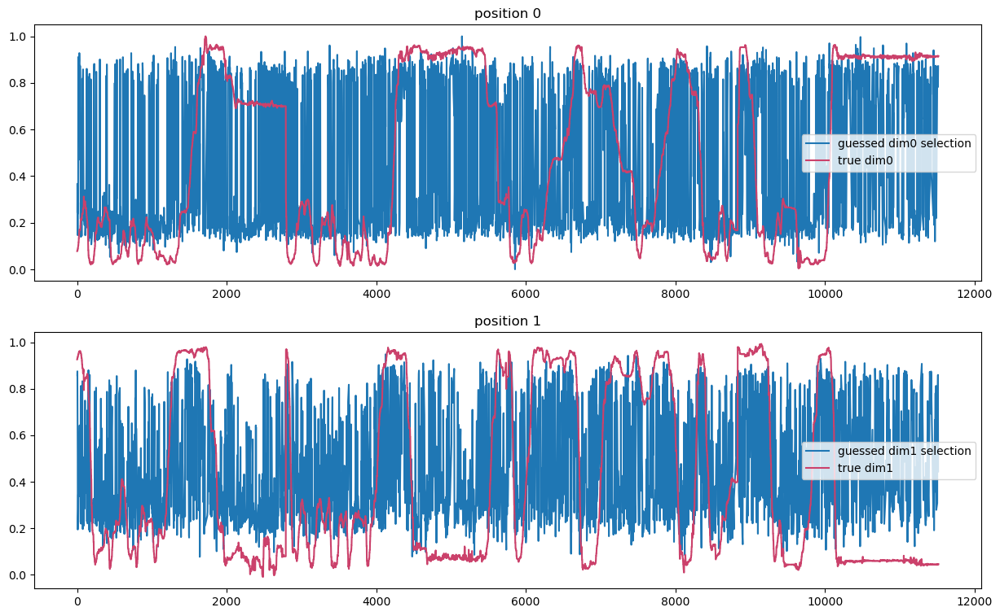

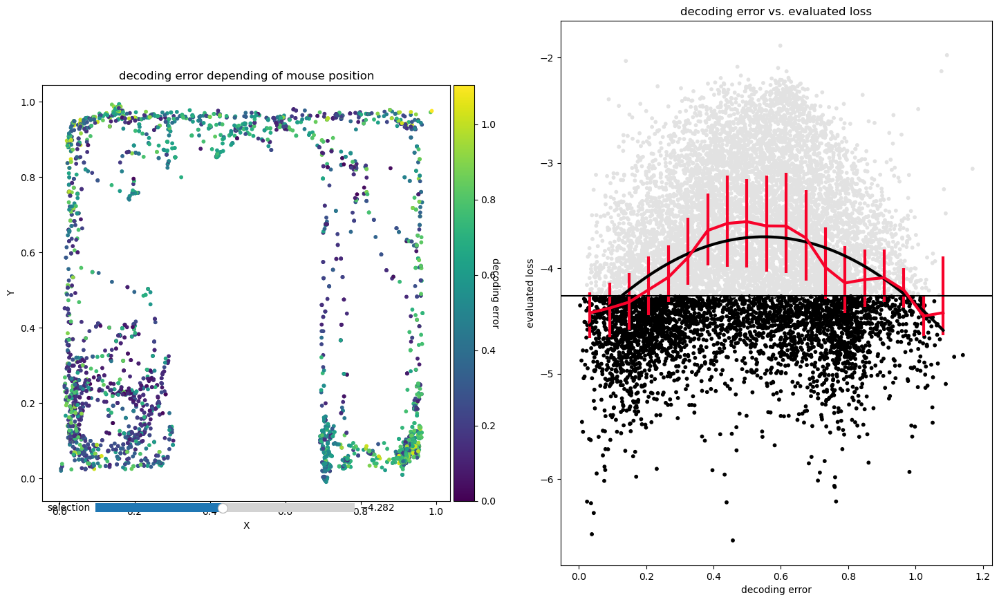

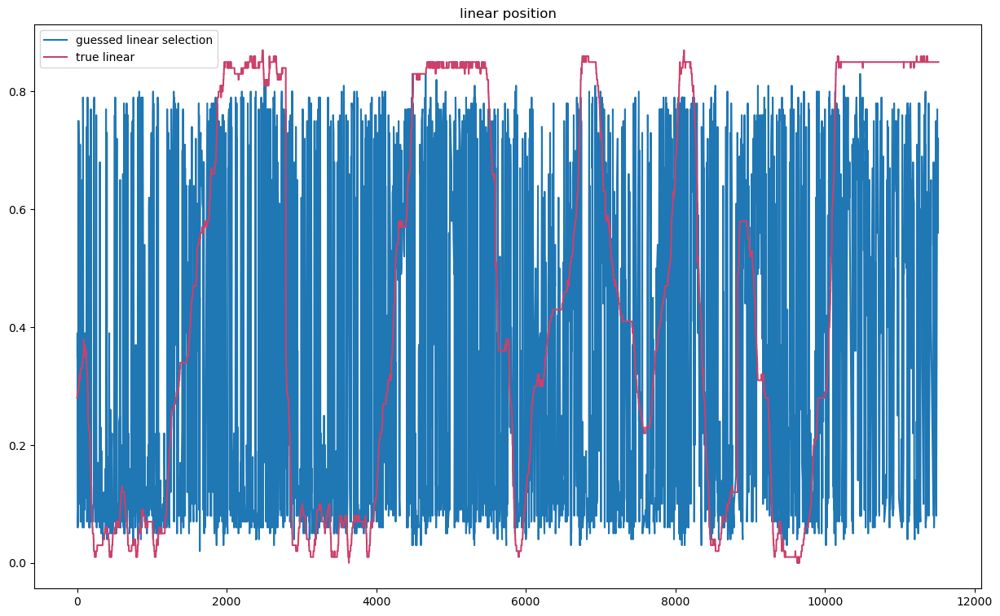

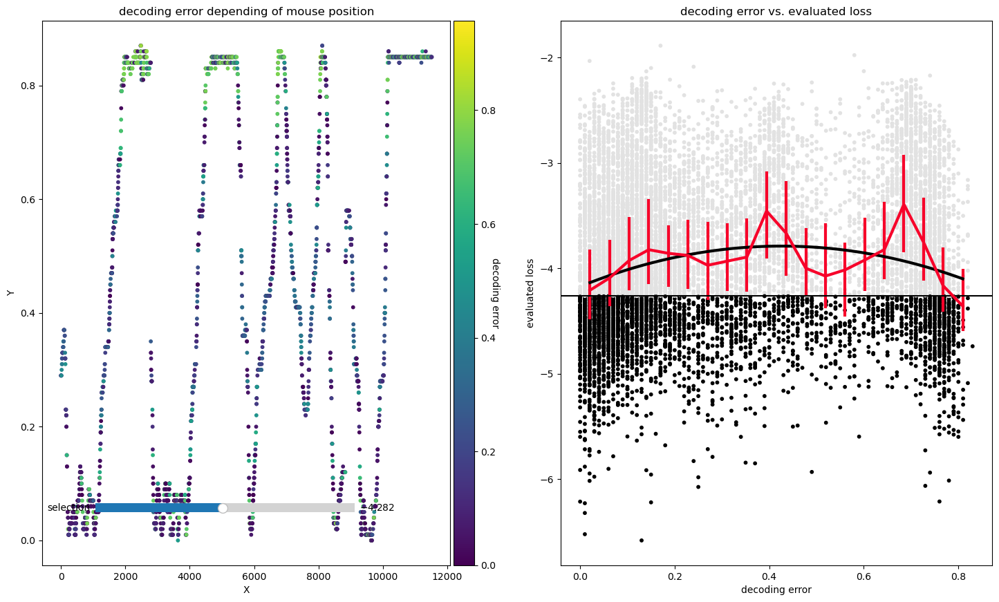

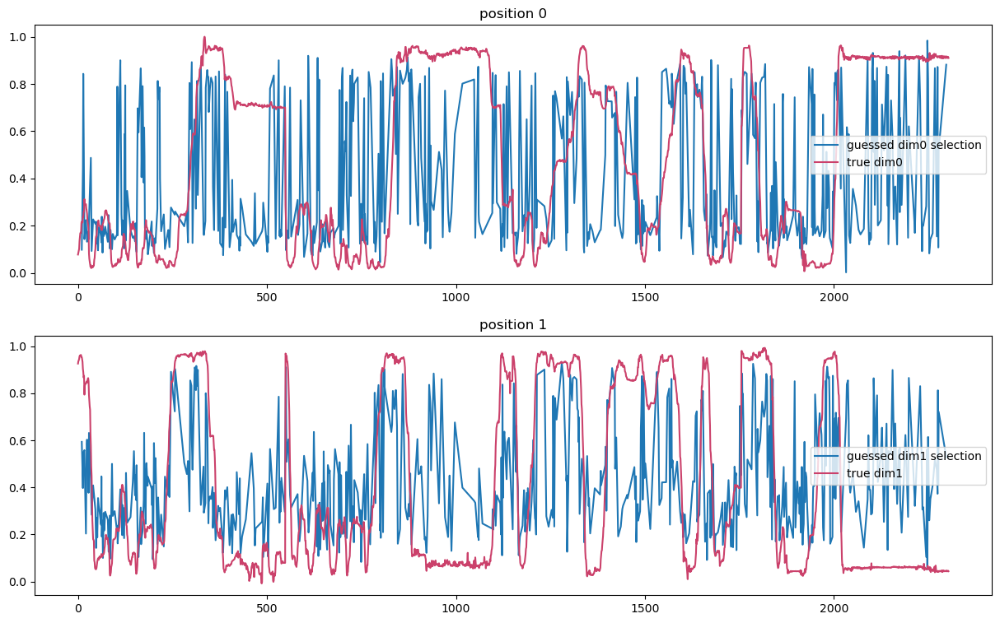

...

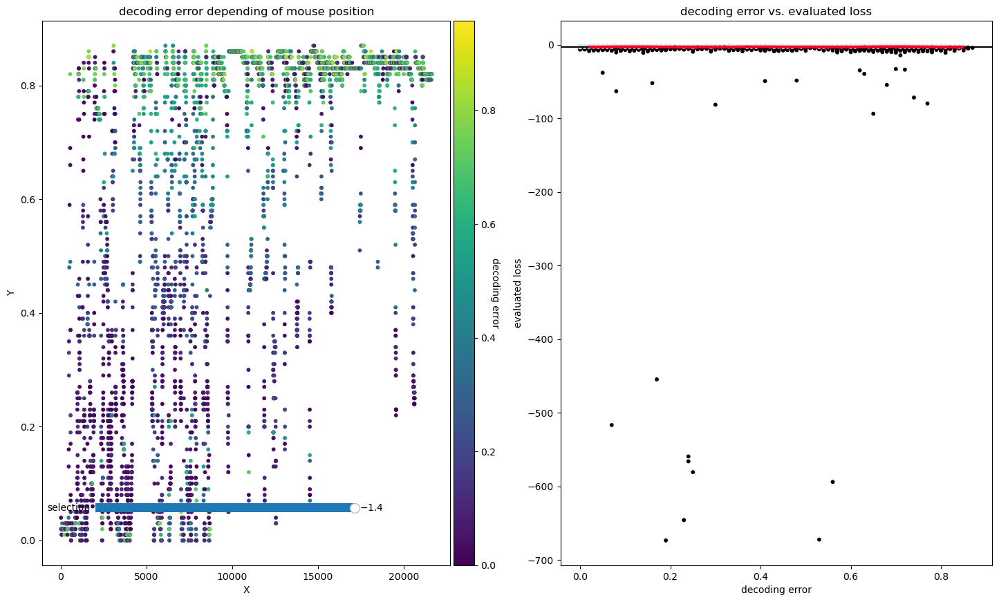

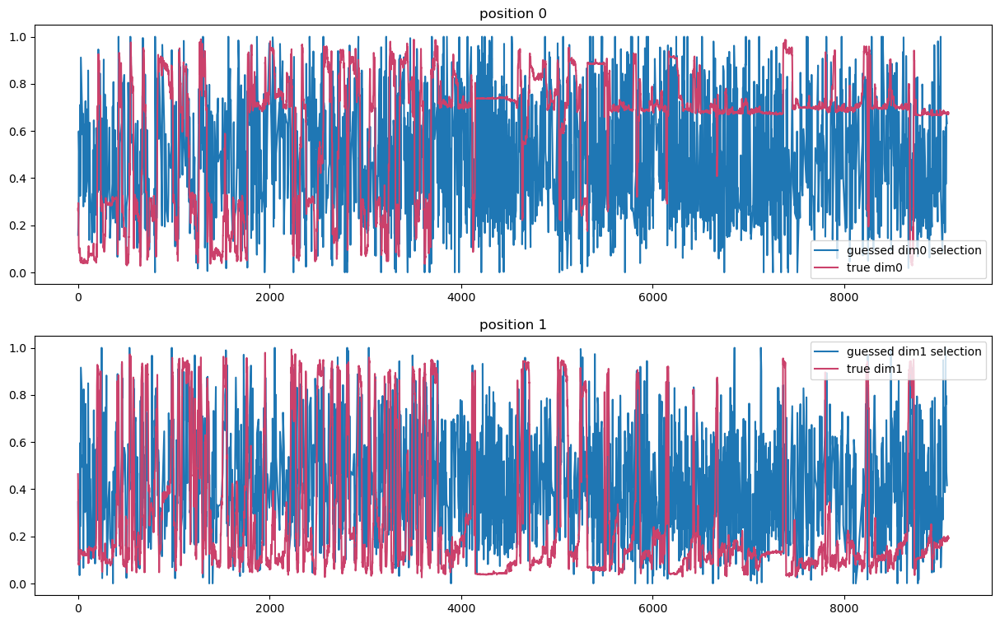

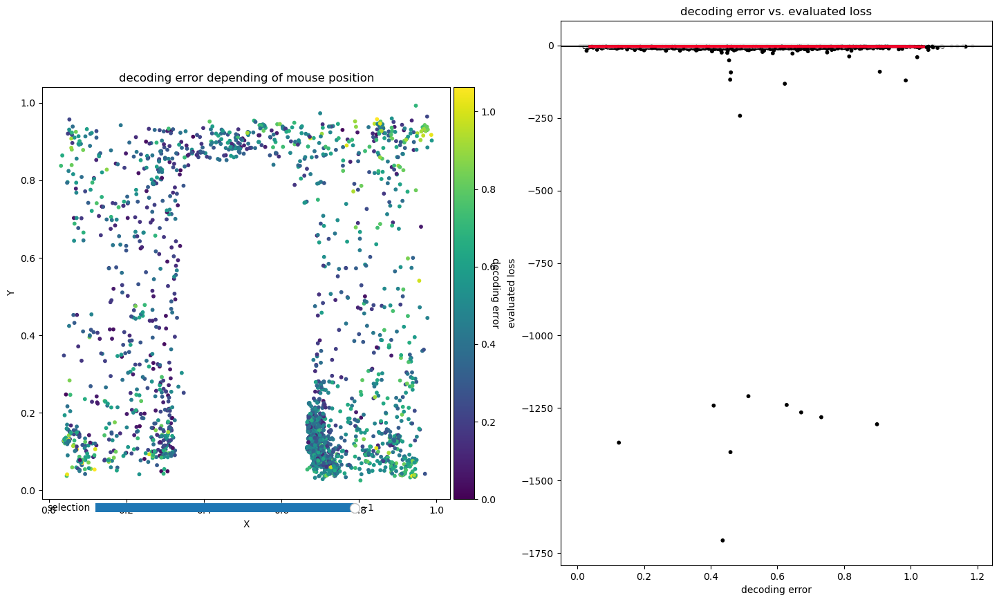

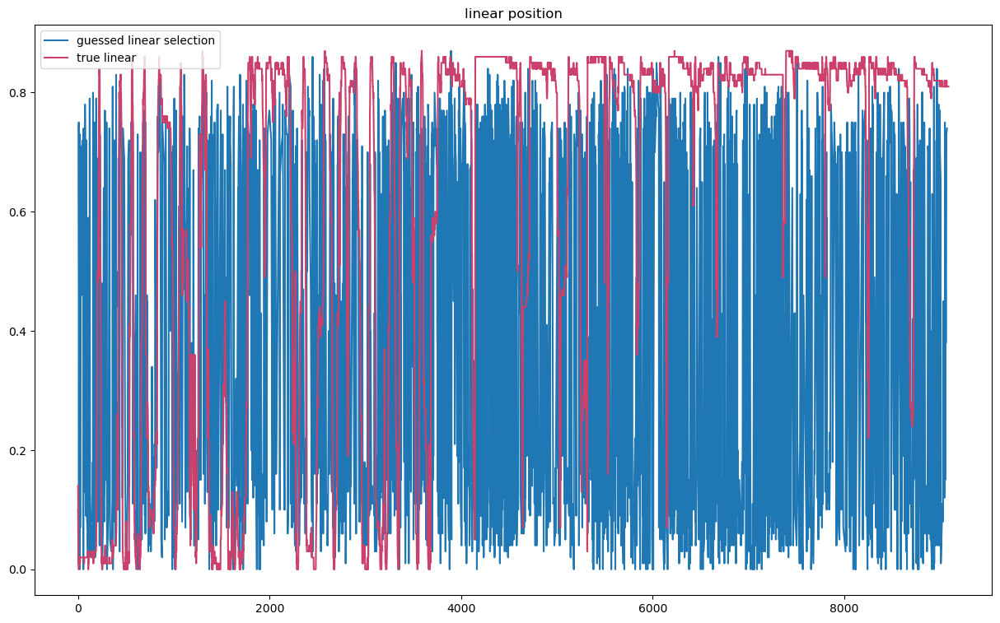

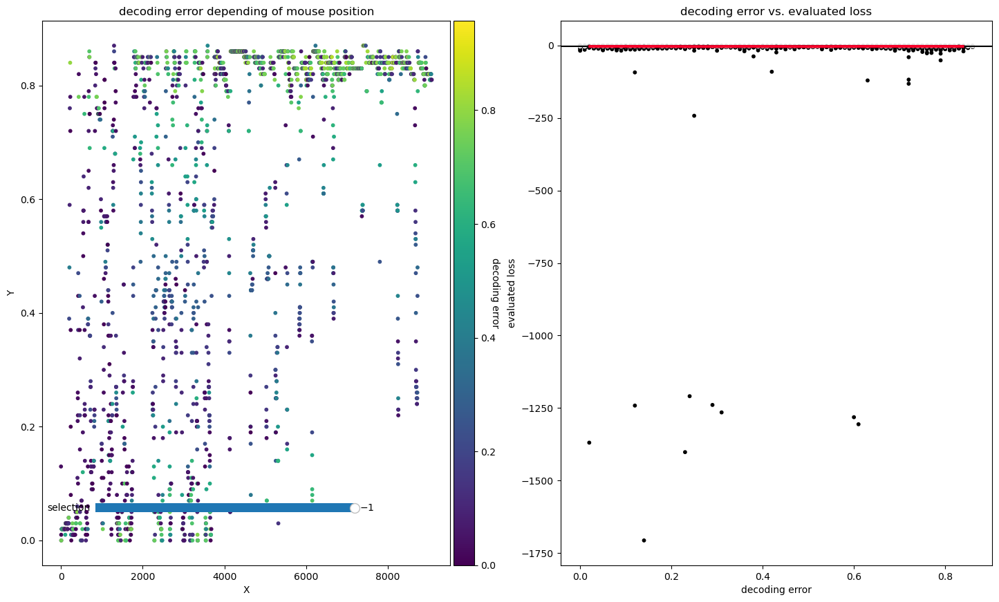

In [189]:
ProjectPath = dict()
DataHelper = dict()
NNTest = dict()
NNTrain = dict()
isPL = True

for mouse, path in path_dict.items():
    xml_file = glob.glob(os.path.dirname(os.path.join(datadir, path)) + "/*.xml")[0]
    nameExp = os.path.basename(path_dict[mouse])
    filename = os.path.expanduser(os.path.join(datadir, path, xml_file))
    print(dirmouse[mouse])
    print(filename)

    ProjectPath[mouse] = Project(filename, nameExp=nameExp)
    DataHelper[mouse] = rawdata_parser.DataHelper(ProjectPath[mouse], "ann")
    for win in results_df[results_df.mouse_id == mouse].windowMS.unique():
        Parameters = Params(helper=DataHelper[mouse], windowSize=win)

        Linearizer = UMazeLinearizer(ProjectPath[mouse].folder)
        l_function = Linearizer.pykeops_linearization

        NNTester = Tester.LSTMandSpikeNetwork(
            ProjectPath[mouse], Parameters, deviceName="/device:GPU:0"
        )
        NNTester.test(
            DataHelper[mouse].fullBehavior,
            l_function=l_function,
            windowsizeMS=win,
            isPredLoss=isPL,
        )
        print_results(NNTester.folderResult, windowSizeMS=win)

        NNTest[mouse] = NNTester
        # '''
        # Decoding during sleep (turn epoch selection off before running this section)
        # '''